## ITSA Muscle Fat Segmentation
#### <B>- Example of execution using unilateral calf scans (T1-weighted images) </B>
#### by Wong MSK Lab - Kenneth Tam, Siwen Liu, AKO Wong

### Important Definitions
**ID** - name of folder containing single patients dcm images <br>
**Slice** - slice number <br>
**ITSA** - interative threshold-seeking algorithm<br>
**ROI mask** - individual thigh after removing the subcutaneous fat and femur. Contains only muscle and inter/intra muscular fat<br>
**F1 fat segements** - segments of fat detected in the ROI mask after 1st round of ITSA (brightest fat segments)<br>
**F2 fat segements** - segments of fat detected in ROI mask after 2nd round of ITSA <br>
**ROI_MuscFatAreaPix** - number of pixels in ROI mask	<br>
**ROI_MuscFatAreaMM** - area of the ROI mask [mm^2]<br>
**ROI_MuscFatVolMM** - volume if the ROI mask [mm^3]	<br>
**F1_AreaPix** - number of pixels that correspond to the F1 fat segments in the ROI mask<br>
**F1_AreaMM** - area of the F1 fat segments in the ROI mask [mm^2]<br>
**F1_MuscAreaPix** - number of pixel remaining in ROI mask after removing F1 fat segments<br>
**F1_MuscAreaMM** - area of remaining ROI mask after removing F1 fat segments [mm^2]<br>
**F1_Perc** - percentage of F1 fat segments relative to entire ROI mask<br>
**F1_VolMM** - 	volume of the F1 fat segments in the ROI mask [mm^3]<br>
**F1_MuscVolMM** - volume of remaining ROI mask after removing F1 fat segments [mm^3]<br>
**F2_AreaPix** - number of pixels that correspond to the F2 fat segments in the ROI mask<br>
**F2_AreaMM** - area of the F2 fat segments in the ROI mask [mm^2]<br>
**Musc_noF2_AreaPix** - number of pixel remaining in ROI mask after removing F1 and F2 fat segments<br>	
**musc_no_F2_AreaMM** - area of remaining ROI mask after removing F1 and F2 fat segments [mm^2]<br>
**F1_Intensity** - mean value of F1 fat segments <br>	
**F2_Intensity** - mean value of F2 fat segments	<br>
**F2_cfactor** - correction of partial volume in pixels, percentage of the volume occupied by IMF within a partial volumed voxel (F2_Intensity/F1_Intensity)<br>
**F2_Perc_NOTc** - percentage of F2 fat segments relative to entire ROI mask without correcting for partial volume<br>
**F2_VolMM_NOTc** - volume of the F2 fat segments in the ROI mask without correcting for partial volume [mm^3]<br>
**BF_FatVol_NOTc** - sum of F1 and F2 fat segments volume without correcting for partial volume[mm^3]<br>
**F2_VolMM_c** - volume of the F2 fat segments in the ROI mask after correcting for partial volume[mm^3]<br>
**F2_MuscVolMMc** - volume of remaining ROI mask after removing F1 and F2 fat segments [mm^3]<br>
after correcting for partial volume<br>
**BF_FatVol_c** - volume from combining F1 and F2 fat segments after correcting for partial volume [mm^3]<br>
**F2_Perc_c** - percentage of F2 fat segments relative to entire ROI mask after correcting for partial volume<br>
**BF_Perc_c** - sum of F2_Perc and F1_Prec after correcting for partial volume<br>
**BF_AreaPix_NOTc** - number of pixels from combining F1 and F2 fat segment masks without correcting for partial volume<br>
**BF_AreaMM^2_NOTc** - area from combining F1 and F2 fat segment masks without correcting for partial volume [mm^2]<br>
**Musc_noBF_AreaPix_NOTc** - number of pixels in ROI mask after removing F1 and F2 fat segments without correcting for partial volume<br>	
**musc_no_BF_AreaMM_NOTc** - area of ROI mask after removing F1 and F2 fat segments without correcting for partial volume [mm^2]<br>
**BF_Perc_NOTc** - percentage of F1 and F2 fat segments relative to entire ROI mask without correcting for partial volume<br>
**BF_VolMM_NOTc** - volume from combining F1 and F2 fat segments without correcting for partial volume [mm^3]<br>
**Musc_noBF_VolMM_NOTc** -volume of ROI mask after removing F1 and F2 fat segments without correcting for partial volume [mm^3]<br>
**TOTAL_FatVol_c** - sum of all fat volumes from a patient (across 15 slices) after correcting for partial volume[mm^3]<br>
**TOTAL_MuscVol_c** - sum of all muscle volumes from a patient (across 15 slices) after correcting for partial volume[mm^3]<br>



### Image Processing Variables
#### Inhomogeneity Correction
Requires sharpening the image first the running inhomogeneity correction followed by a series of blurring, thresholding and denoising functions. The thighs are then isolated and their location noted. Another inhomogeneity correction occurs before the background is removed. The final image is the 2 thighs on a black background.
#### Within Snake
**alpha** - snakes energy, tendency to move away from original initiator (higher alpha=more freedom to move)-small here given that initiated snake is close to fascia <br>
**beta** - smoothness (higher beta = smoother) <br>
**w_line** -  attraction the dark/white (- means attracted to dark pixels, + to white pixels) <br>
**w_edge** - attraction to edges (higher=more attraction)  <br>

In [1167]:
# Import functions
import tensorflow as tf
%run IMF_ITSA_Definitions_Final.ipynb

In [1168]:
# Definitions - Please customize the variables below according to your use case:
# Revised 10-01-2024 by AW
'''
  *** indicate where changes could be made
'''
# Set image directory and output directory
# Make sure no other folders (such as Corrections and Data folders below) are in this directory
#patpath = r"C:\Users\WongAKO\PyProj\OAIThighProcess\OAIThighswithBMLs\3.C.2"  # *** change to directory with folders containing images to process
patpath = r"C:\Users\WongAKO\PyProj\OAIThighProcess\AMBERSCalf\Patients"

# Set "Corrections" directory: 
output_dir = r"C:\Users\WongAKO\PyProj\OAIThighProcess\AMBERSCalf\Corrections" # *** change to output directory for tags to be fixed using Sliceomatic

# Set final "Data" outputs directory: 
outdata = r"C:\Users\WongAKO\PyProj\OAIThighProcess\OAIThighswithBMLs\Data"

# Chosen number of participants to display (quality control) when separating left and right anatomies 
batch_size = 3 # define based on fixed number OR on percentage (line below)
#batch_size = round(0.5*(len([d for d in os.listdir(patpath) if os.path.isdir(os.path.join(patpath, d))]))) #define based on percentage

# Define anatomy: 
anatomy = 1 # default 1 = single part (for example, unilateral calf scan), 2 = 2 parts side by side (for example two thighs left and right)
anatside = 0 # default 0 = invariant (if anatomy = 1), 1 = left, 2 = right 

# ADVANCED SETUP: 

# Changes to definitions notebook: 
# def primary_snake(): can change snake parameters:  alpha=0.01,gamma=20,w_edge=8,w_line=-0.5,max_num_iter=5,max_px_move=1

In [1186]:
# File structure and image property setup 
totpat = len([d for d in os.listdir(patpath) if os.path.isdir(os.path.join(patpath, d))])

# Automatically identifies directory structure just above DCM files and uses it as root based on parent directory provided above (patpath)

uniqueroot = [] 
for folder in os.listdir(patpath):
    patfolder = os.path.join(patpath,folder)
    
    ID_count = 0
    i = 0
    fileroot = []
    
    for root, dirs, files in os.walk(patfolder):
        for file in files:
            file_path = os.path.join(root, file)
            try:
                # Attempt to read the file as a DICOM file
                dicom_header = pydicom.dcmread(file_path)
                # If successful, return the directory and stop searching
                if len([d for d in os.listdir(root)]) == 8: # *** Add your own condition here to filter out correct MRI series 
                                                            # could also use:  dicom_header.get((0x0008, 0x103E), "Tag not found")[:]
                    fileroot.append(root)
                else:
                    continue
            except:
                # If not a DICOM file, continue
                continue
    
    uniqueroot.append(list(set(fileroot))[0])

# read sample image to get shape parameters for empty 4D array 
patdcm = sitk.ImageSeriesReader_GetGDCMSeriesFileNames(uniqueroot[0])
patsitk=sitk.ReadImage(patdcm)
read_data=sitk.GetArrayFromImage(patsitk) 
pxsp = patsitk.GetSpacing()[0]
adjfactor = (0.9765625//pxsp)

minsize = 2*int(np.round(8*adjfactor,0)) # *** this is automatically calibrated based on pixel spacing - but can be manually adjusted. 
# minsize is used in various functions as a threshold for removing noise (e.g. minimum island size below which it is removed)

In [1187]:
%%time
# Pre-process and inhomogeneity correct images
# Revised 10-01-2024 by AW
# applies to all images
 
#create empty 4D array with size from number of patients and first patient file
shape = (totpat, read_data.shape[0], read_data.shape[1], read_data.shape[2]) 
pat4d = np.empty(shape, dtype='uint8')

ID_count = 0
i = 0

for dcmdir in uniqueroot:    
    for item in os.listdir(dcmdir):
        try: 
            file_full_path = os.path.join(dcmdir,item)
            m = sharpen1(read_data=file_full_path, filename=item, mode="e_s")          
            m = brightness_correction(read_data=m[0], filename=m[1], mode="CLAHE", strength=6.2, gridsize=minsize+3)
            m = blur(read_data=m[0], filename=m[1], mode="m_b", strength=5)
            m = blur(read_data=m[0], filename=m[1])
            m = blur(read_data=m[0], filename=m[1])
            m = blur(read_data=m[0], filename=m[1])
            m = blur(read_data=m[0], filename=m[1])
            m = blur(read_data=m[0], filename=m[1], mode="m_b",strength=7)
            m = thresholding(read_data=m[0], strength=55, filename=m[1])
            m = blur(read_data=m[0], filename=m[1], mode="m_b", strength=5)
            m = denoise(read_data=m[0], filename=m[1])
            m = blur(read_data=m[0], filename=m[1], mode="m_b", strength=11)
            m = fill_contours(read_data=m[0], filename=m[1], crop=True, dilation_iterations=6)
            m = blur(read_data=m[0], filename=m[1], mode="m_b", strength=13, show_images=False)

            f = brightness_correction(read_data=file_full_path, mode="CLAHE", strength=4.0, filename=m[1], gridsize=minsize+5)
            f = get_cleaned_image(read_data=f[0], mask=m[0], filename=f[1], show_images=False) 

            pat4d[ID_count, i, :, :] = f
           
            total_pixels = m[0].size
            black_pixels = np.count_nonzero(m[0] == 0)
            white_pixels = np.count_nonzero(m[0] == 255)
        
            # Calculate the percentage
            black_percentage = (black_pixels / total_pixels) * 100
            white_percentage = (white_pixels / total_pixels) * 100
            
            i += 1 #add to slice counting index
        except:
            # If not a DICOM file, continue
            continue
    i = 0  #reset slice index after completion of participant   
    ID_count += 1

CPU times: total: 4.48 s
Wall time: 7.2 s


In [1188]:
# Split the anatomy into left and right legs if anatomy is set to 2
# Revised 10-01-2024 by AW

if anatomy == 2: 

    # Initialize an empty array to store the left leg images, with dimensions based on pat4d
    shape = (len(pat4d),len(pat4d[0]),len(pat4d[0,0]),len(pat4d[0,0]))
    lthigh_arr = np.empty(shape, dtype='uint8') 
    for ID_count in range (len(pat4d)):
        print(ID_count, "- left leg")
        read_data = pat4d[ID_count,-1] #check last slice as it is likely the biggest
        rmv_count,num_columns_to_remove = GetShift(read_data,'L')
        for i in range (len(pat4d[0])):
            read_data = pat4d[ID_count,i] 
            centered_image = LegSepNew(read_data,'L',rmv_count,num_columns_to_remove)
            new_centered_image = centered_image[:,:] 
            lthigh_arr[ID_count, i, :, :] = new_centered_image

    # Initialize an empty array to store the right leg images, with dimensions based on pat4d
    shape = (len(pat4d),len(pat4d[0]),len(pat4d[0,0]),len(pat4d[0,0]) ) 
    rthigh_arr = np.empty(shape, dtype='uint8') 
    for ID_count in range (len(pat4d)):
        print(ID_count, "- left leg")
        read_data = pat4d[ID_count,14] #check last slice as it is likely the biggest
        rmv_count,num_columns_to_remove = GetShift(read_data,'R')
        for i in range (len(pat4d[0])):
            read_data = pat4d[ID_count,i] 
            centered_image = LegSepNew(read_data,'R',rmv_count,num_columns_to_remove)
            new_centered_image = centered_image[:,:] 
            rthigh_arr[ID_count, i, :, :] = new_centered_image
    
    #check all images for cutoff errors in a batch of patients (specified by "batch_size")
    j=rthigh_arr.shape[1]
    for i in range(batch_size):
        i = i + 0 #***change i to cycle through all images
        stackimages(rthigh_arr[i])

elif anatomy == 1:
    # otherwise just use pat4d
    j=pat4d.shape[1]


In [1189]:
# Manually correcting separation using user-defined x-min and x-max values 
# Do not run this if anatomy separation was successful 

# Specify variables for manual correction: 

#Participant ID: 
use_manual = 0 # Set to 1 to run manual correction using user-defined boundaries, otherwise default is 0

# if using manual (use_manual = 1), then enter manual cutoff x values to separate left and right anatomies
ID_count = 2 # participant number in index 
end_x_L = 202 # *** last x coordinate of left thigh - this needs to be changed  
start_x_R = 402 # *** first x coordinate of right thigh - this needs to be changed  

if anatomy == 2 & use_manual == 1: 
    # Left leg array - Initialize the left leg array for storing corrected images
    shape = (len(pat4d),len(pat4d[0]),len(pat4d[0,0]),len(pat4d[0,0]) )
    lthigh_arr = np.empty(shape, dtype='uint8') 

    read_data = pat4d[ID_count,pat4d.shape[1]-1] # Check the last slice, as it typically shows the largest cross-section of the thigh
    rmv_count,num_columns_to_remove = GetShiftManual(read_data,'L',end_x_L)
    for i in range (pat4d[ID_count].shape[0]):
        read_data = pat4d[ID_count,i] 
        centered_image = LegSepNewManual(read_data,'L',end_x_L, rmv_count,num_columns_to_remove)
        new_centered_image = centered_image[:,:] 
        lthigh_arr[ID_count, i, :, :] = new_centered_image

    # Right leg array - Initialize the right leg array for storing corrected images
    shape = (len(pat4d),len(pat4d[0]),len(pat4d[0,0]),len(pat4d[0,0]) )
    rthigh_arr = np.empty(shape, dtype='uint8') 

    read_data = pat4d[ID_count,pat4d.shape[1]-1] # Check the last slice, as it typically shows the largest cross-section of the thigh
    rmv_count,num_columns_to_remove = GetShiftManual(read_data,'R',start_x_R)
    for i in range (pat4d[ID_count].shape[0]):
        read_data = pat4d[ID_count,i] 
        centered_image = LegSepNewManual(read_data,'R',start_x_R, rmv_count,num_columns_to_remove)
        new_centered_image = centered_image[:,:] 
        rthigh_arr[ID_count, i, :, :] = new_centered_image

In [1190]:
# Default array name has no left and right
# When analyzing left or right side, assign which one to the default array name based on anatside above

if anatside == 2:
    I8c_subcfat_imp_arr=[]
    I8c_subcfat_imp_arr=rthigh_arr  
    
    I8c_roi_imp_arr=[]
    I8c_roi_imp_arr=rthigh_arr      
    
elif anatside == 1:
    I8c_subcfat_imp_arr=[]
    I8c_subcfat_imp_arr=lthigh_arr  
    
    I8c_roi_imp_arr=[]
    I8c_roi_imp_arr=lthigh_arr 

elif anatside == 0:
    I8c_subcfat_imp_arr=[]
    I8c_subcfat_imp_arr=pat4d  
    
    I8c_roi_imp_arr=[]
    I8c_roi_imp_arr=pat4d

In [1191]:
%%time
# Automated ITSA Segmentation
# Revision 09-30-2024 - by AW 

from skimage.measure import label, regionprops

#create masks only

Ivol8_OG=[] # List to store original volume images for each participant
Ivol8_L=[] # list to store images after being extended by 40 pixels on each side
Ivol8c_subcfat_L=[] # List to store subcutaneous fat processed images for the left thigh
Ivol8c_roi_L=[] #stores images after centering by adding and enlarging pixels on all 4 sides (contains all participant's left thigh)
Ivol8c_c_s_L=[] #list of sharpness enhanced images
subcfat_ring_L=[] #stores subcutaneous fat ring data
musc_mask_final_L=[] #final mask for muscle segmentation
#t_L=[] - not sure where this being used, can possibly remove 
musc_mask2=[] #muscle mask
snake1_mask_L=[] #segmentation mask obtained by using a snake or contour
bone_z_L=[] #bone segmentation
bonem_final_L=[] #final bone mask
bonem_c_L=[] #merged bone mask
roi_mask_L=[] #mask without the bone

fatseg_mask_final_R1_L=[] #final fat segmentation mask after Round 1 of ITSA
fatseg_final_R1_L=[] #final fat segmented region after Round 1 of ITSA
fatseg_mask_final_R2_L=[] #final fat segmentation mask after Round 2 of ITSA
fatseg_final_R2_L=[] #final fat segmented region after Round 2 of ITSA
for_zcheck_S2R1_L=[] #Fat mask generated after set 2 and Round 1 of ITSA to confirm z-connectivity 
fatseg1_mask_final_S1_L=[] #final fat segmentation mask after Round 1 of ITSA
fatseg1_final_S1_L=[] #final fat segmented region after Round 1 of ITSA
fatseg2_mask_final_S1_L=[] #final fat segmentation mask after Round 2 of ITSA
fatseg2_final_S1_L=[] #final fat segmented region after Round 2 of ITSA
final_fat_mask_L=[] #final fat mask after both sets of ITSA 
final_fat_L=[] #final fat region after both sets of ITSA 
final_musc_fat_mask_L=[]

for ID_count in range(I8c_roi_imp_arr.shape[0]):
    Ivol8_OG,j_OG = I8c_roi_imp_arr[ID_count], I8c_roi_imp_arr[ID_count].shape[0]
     
    #APPLY START SLICE
    Ivol8c_subcfat=I8c_subcfat_imp_arr[ID_count]
    Ivol8c_roi=I8c_roi_imp_arr[ID_count]
    Ivol8=Ivol8_OG

    #Extend ALL four sides of each image by 40 pixels 
    Ivol8,pixels=enlarge_size(Ivol8,40)
    Ivol8c_subcfat,pixels=enlarge_size(Ivol8c_subcfat,40)
    Ivol8c_roi,pixels=enlarge_size(Ivol8c_roi,40)
    bonem_c = np.zeros([Ivol8c_roi.shape[0], Ivol8c_roi.shape[1], Ivol8c_roi.shape[2]], dtype='uint8')
    
    Ivol8_L.append([])
    Ivol8_L[ID_count]=Ivol8

    Ivol8c_roi_L.append([])
    Ivol8c_roi_L[ID_count]=Ivol8c_roi

    Ivol8c_subcfat_L.append([])
    Ivol8c_subcfat_L[ID_count]=Ivol8c_subcfat

    #try:
    #MUSCLE MASK
    subcfat=get_subcfatvol(Ivol8c_subcfat, minsize)
    musc_fat_mask=get_musc_fat_mask(Ivol8c_subcfat, minsize)
    subcfat_ring=get_subcfat_ring(musc_fat_mask)
    curvature_flow=apply_CurvatureFilter(Ivol8c_subcfat*musc_fat_mask,Ivol8c_roi) 
    Ivol8c_c_s=enhance_sharpness(curvature_flow)
    subcfatvol=get_subcfatvol(Ivol8c_c_s, minsize)
    
    #for calf:
    if anatomy == 1:
        subcfatvol_augmented=subcfatvol+subcfat_ring
        #subcfatvol_augmented = np.uint8(morphology.remove_small_holes(label(subcfatvol_augmented),area_threshold=300, connectivity=1)) # *** removing small holes   
        #th, subcfatvol_augmented = cv2.threshold(subcfatvol_augmented, 0, 1, cv2.THRESH_BINARY)
        
        for i in range(subcfatvol_augmented.shape[0]):
            _, subcfatvol_augmented[i] = cv2.threshold(subcfatvol_augmented[i], 0, 1, cv2.THRESH_BINARY)

    #for thigh:
    elif anatomy == 2:
        subcfatvol_augmented=subcfatvol+subcfat_ring 
        th, subcfatvol_augmented = cv2.threshold(subcfatvol_augmented, 0, 1, cv2.THRESH_BINARY)
    
    t, musc_mask2=darkpieces(subcfatvol_augmented, minsize) # Extract dark regions from the subcutaneous fat volume (subcfatvol_augmented) and create an initial muscle mask (musc_mask2)
    
    overshoot1,overshoot_removed1=remove_subcfat_overshoot(musc_mask2,Ivol8c_c_s,1,minsize)
    overshoot2,overshoot_removed2=remove_subcfat_overshoot(overshoot_removed1,Ivol8c_c_s,2,minsize)
    b=keep_overlaps(overshoot_removed2,1,minsize)

    musc_mask2=b # Update the muscle mask with the refined version after fixing subc fat overshoot from muscle masks using thresholds

    #Generate a convex hull around the muscle
    mask_contours, contour_coords_L=get_contours(musc_mask2)
    hull, hull_demonstration,hull_coords=convex_hull(contour_coords_L)
    hullmask=floodfillall(hull) 

    hullmask_contour, hull_coords2=get_contours(hullmask)

    initiator_coords=compatible_coordlist(hull_coords2) 
    
    #REMOVE VESSELS from the main image Ivol8c_c_s
    vessels_removed_mask, vessels_present=remove_vessels(Ivol8c_c_s, minsize)
    pre_vessels_mask=vessels_removed_mask-vessels_present
    vessels_mask=get_vessels(minsize)

    whites=get_whites() #generate white mask for snakes to follow 
    snake_im=get_snakeim()
    bilateral_t=bilat_fil_snake_im(snake_im)
    snake1_coords=primary_snake()
    snake1_mask=snaketomask(snake1_coords)
    
    snake1_mask_L.append([])
    snake1_mask_L[ID_count]=snake1_mask

    # Use the final muscle mask obtained from the snake algorithm (snake1_mask) as the base for further processing
    musc_mask_final=snake1_mask    
    
    #BONE REMOVAL
    bone_prep, subcfatmask=get_boneprep(Ivol8c_subcfat,minsize) # AW added subcfatmask

    # Deprecated by AW
    # if anatomy == 1:
    #     bone_prep2=find_potentialbone2(bone_prep)
    # elif anatomy == 2:
    #     bone_prep2=find_potentialbone(bone_prep)
    
    bone_prep2=tibmask(minsize) # uses bone_prep by default

    # Deprecated by AW
    # bone_z,bone_nonz=Z_connectivity_w_adj(bone_prep2)

    # bone_z_L.append([])
    # bone_z_L[ID_count]=bone_z

    # bonem_final=find_potentialbone2(bone_z) 
    # bonem_final_L.append([])
    # bonem_final_L[ID_count]=bonem_final

    cortical=corticaloutline(Ivol8c_c_s,minsize)

    for i in range(j):
        bonem_c[i]=merge_bones(cortical[i],bonem_final[i],minsize)

    if anatomy == 1: 
        fibmask2 = fibmask()
        bonem_c = bonem_c + fibmask2
    
    bonem_c_L.append([])
    bonem_c_L[ID_count]=bonem_c
    
    # Create the region of interest (ROI) mask by combining the muscle mask (snake1_mask), the comprehensive bone mask (bonem_c), and the subcutaneous fat volume (Ivol8c_subcfat)
    roi_mask, roi=get_roi(snake1_mask,bonem_c,Ivol8c_subcfat)  

    roi_mask_L.append([])
    roi_mask_L[ID_count]=roi_mask # Store the final ROI mask for the current patient (ID_count) in the roi_mask list
    
    print(f"{ID_count}. {os.listdir(patpath)[ID_count]} success") #indicates that the process was successful

    # except: #skip any errors
    #     print(f"{ID_count}. {files} encountered an error")
    #     #create placeholders incase errors are encountered
    #     snake1_mask_L.append(None)
    #     roi_mask_L.append(None)
    #     bonem_c_L.append(None)
    #     bonem_final_L.append(None)
    #     bone_z_L.append(None)
    #     for_zcheck_S2R1_L.append(None)
    #     fatseg1_mask_final_S1_L.append(None)
    #     fatseg1_final_S1_L.append(None)
    #     fatseg2_mask_final_S1_L.append(None)
    #     fatseg2_final_S1_L.append(None)
    #     final_fat_mask_L.append(None)
    #     final_fat_L.append(None)
    #     fatseg_mask_final_R1_L.append(None)
    #     fatseg_final_R1_L.append(None)
    #     fatseg_mask_final_R2_L.append(None)
    #     fatseg_final_R2_L.append(None)
    #     continue

# outputs:  roi, roi_mask, bonem_c (tibia only)

0. AM10369 success
1. AM10371 success
2. AM10372 success
3. AM10374 success
4. AM10375 success
CPU times: total: 11.9 s
Wall time: 15.7 s


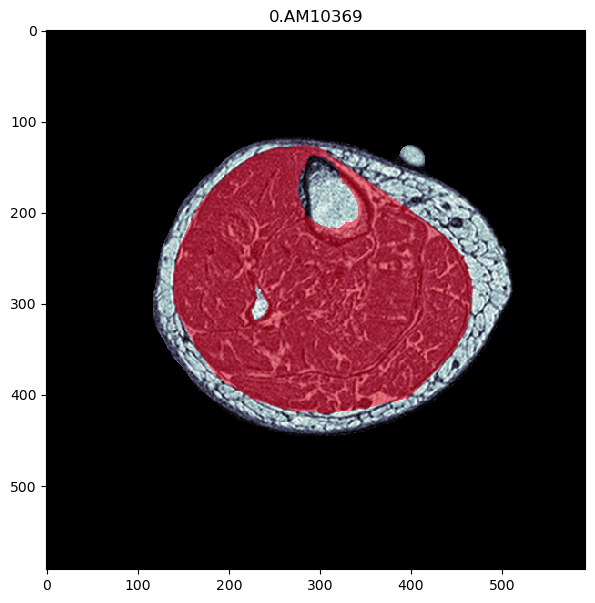

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

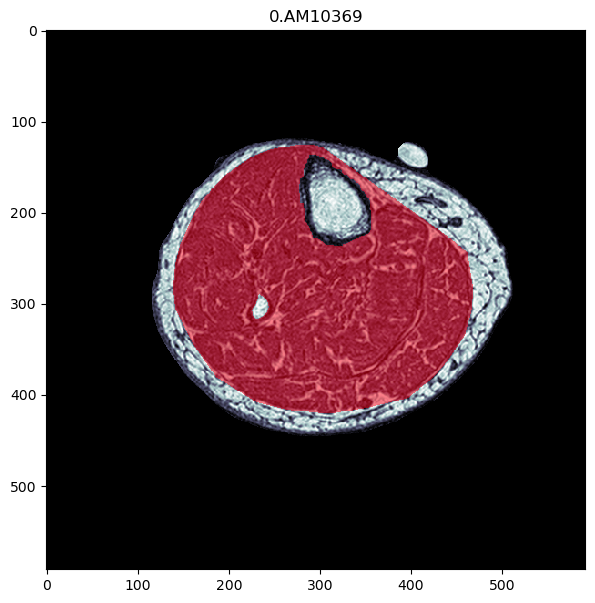

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

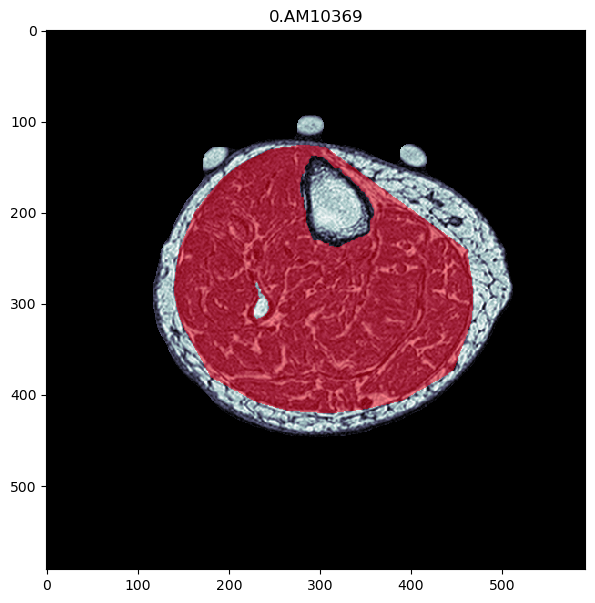

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

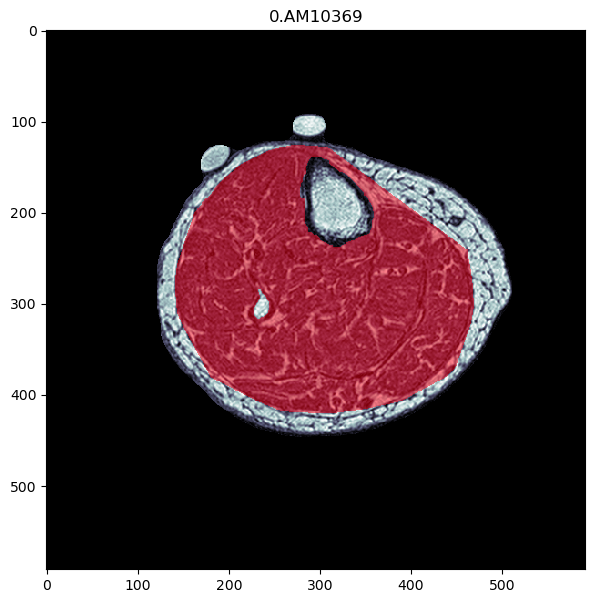

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

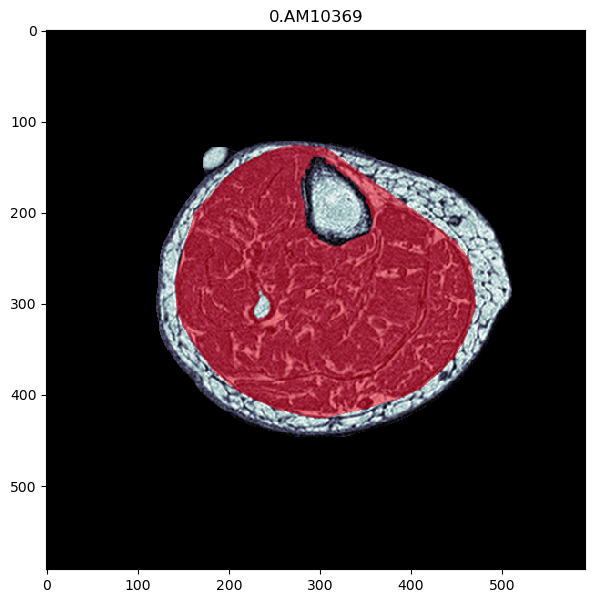

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

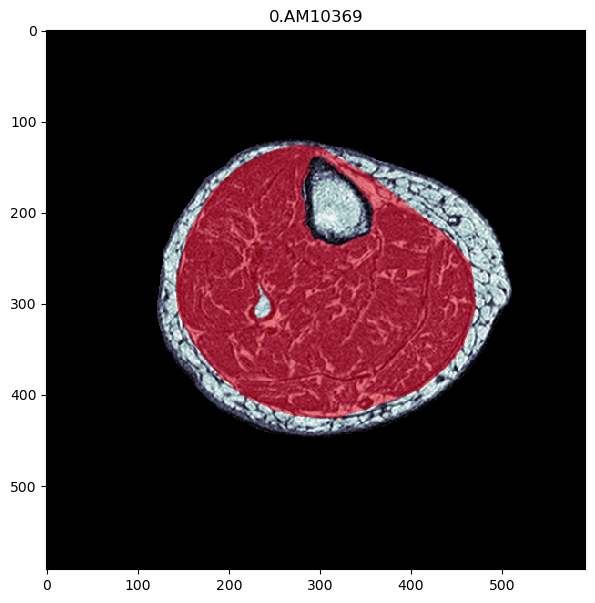

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

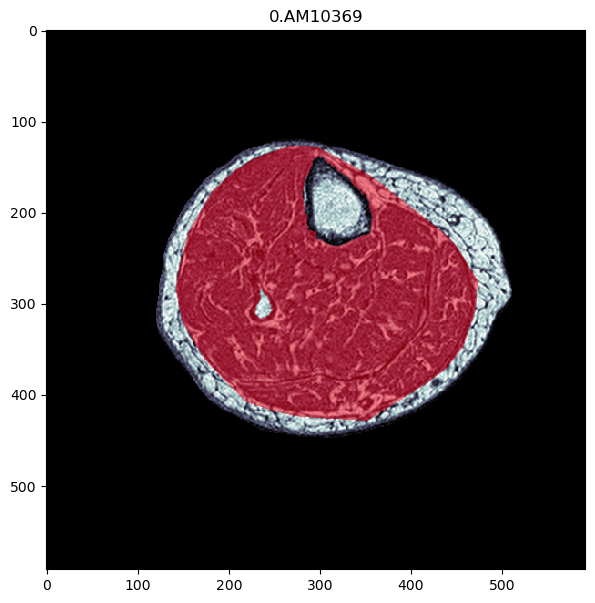

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

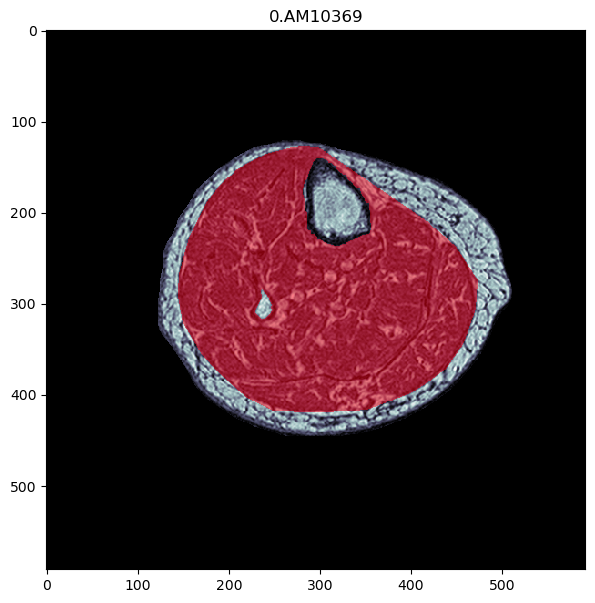

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

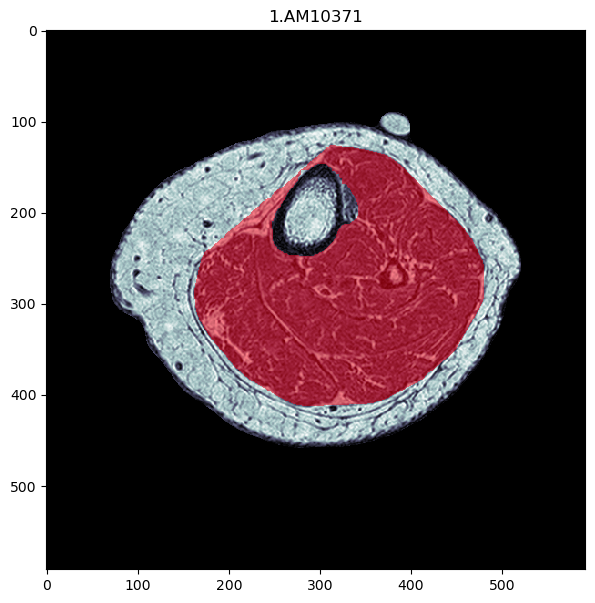

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

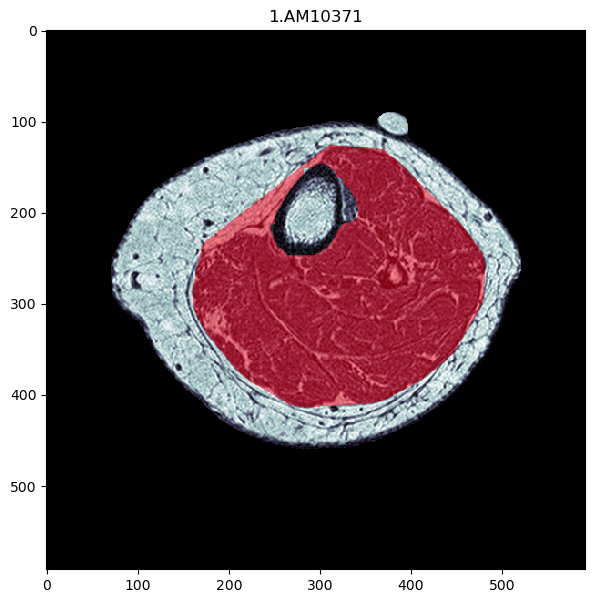

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

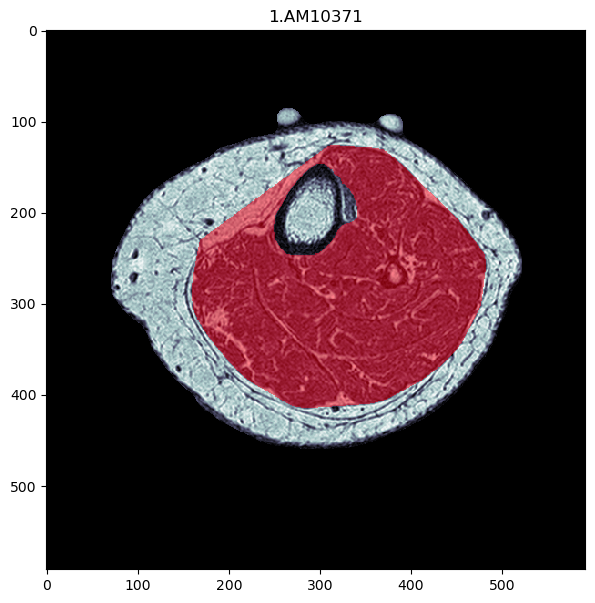

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

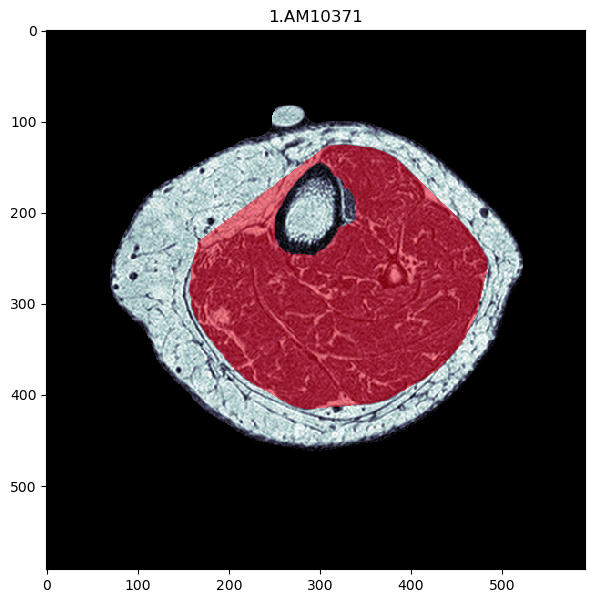

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

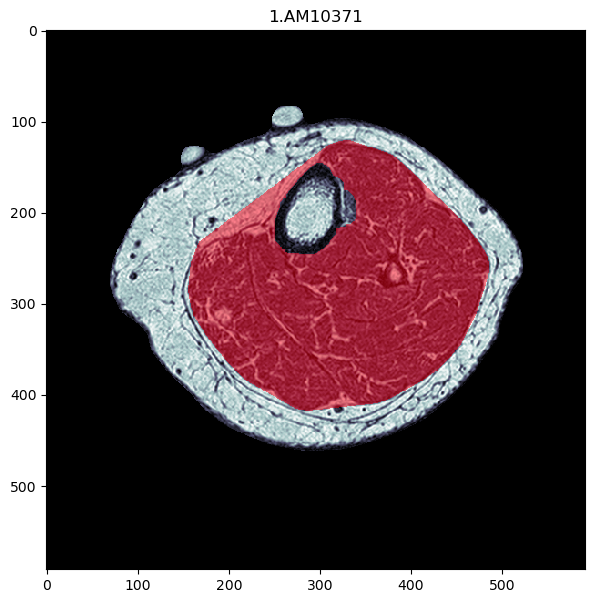

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

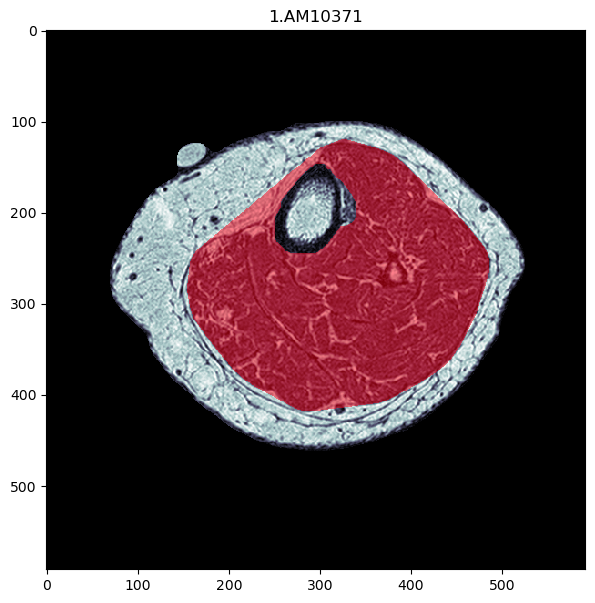

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

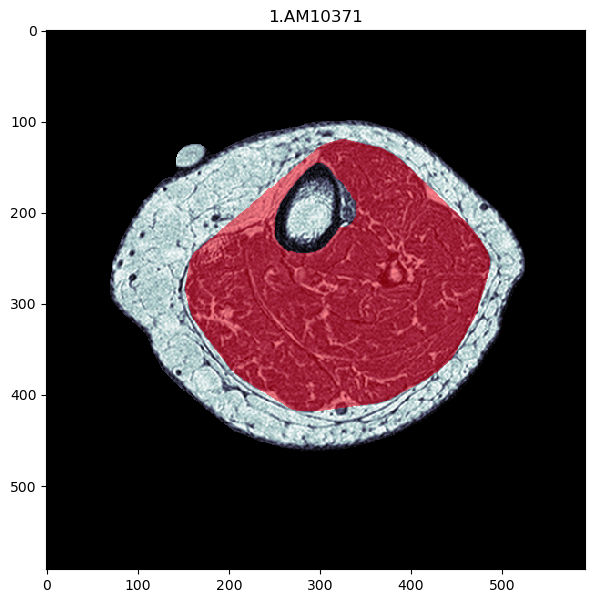

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

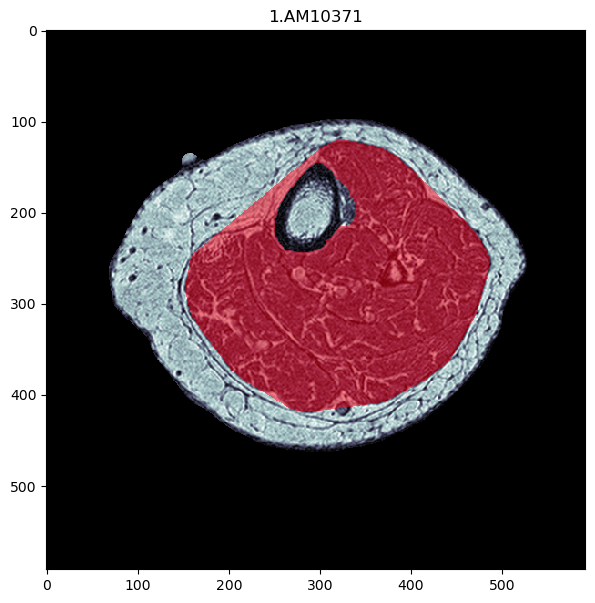

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

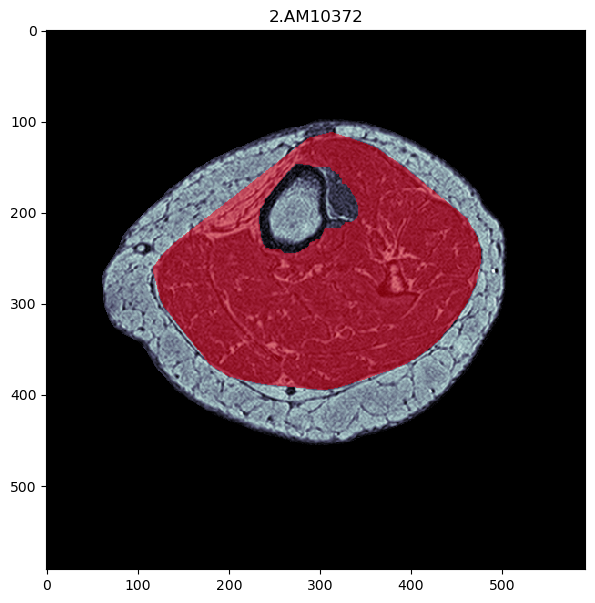

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

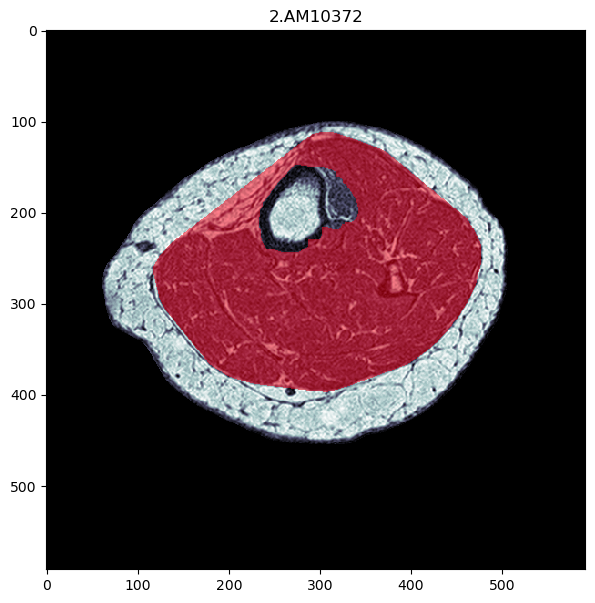

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

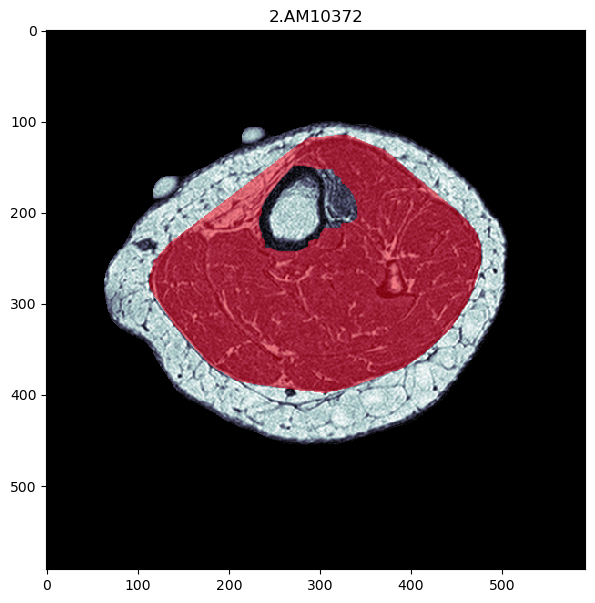

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

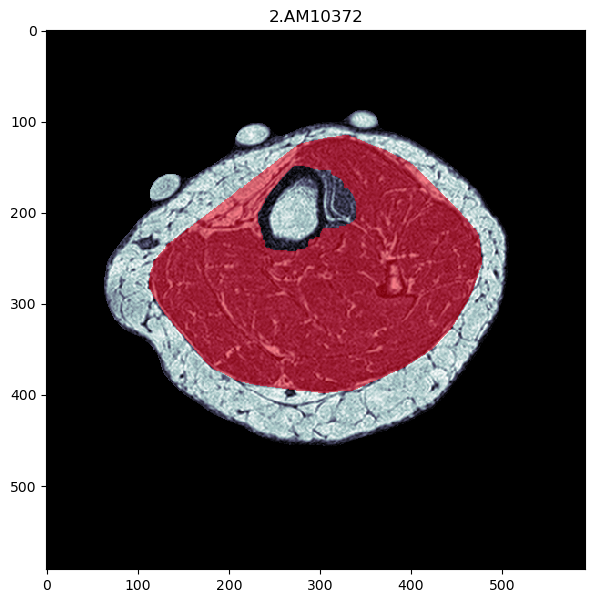

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

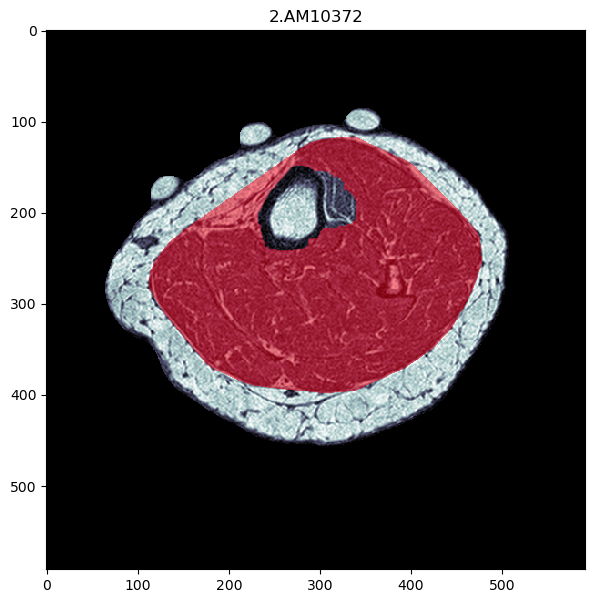

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

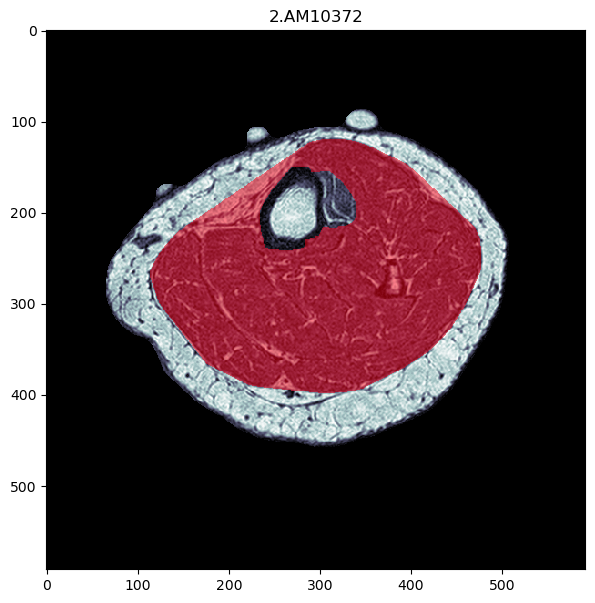

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

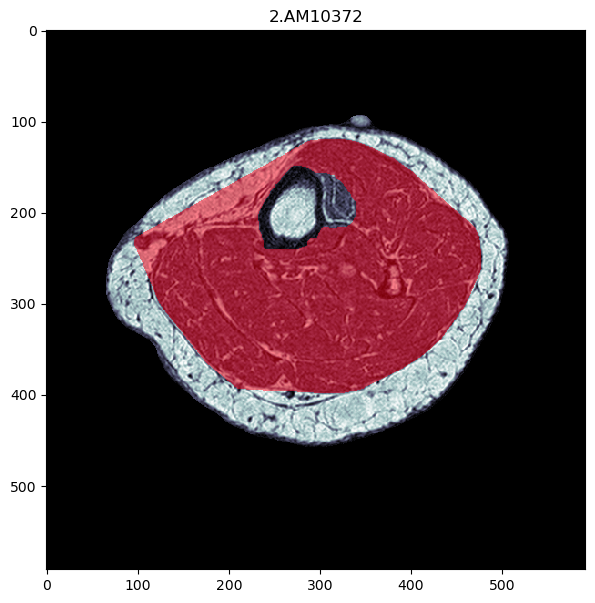

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

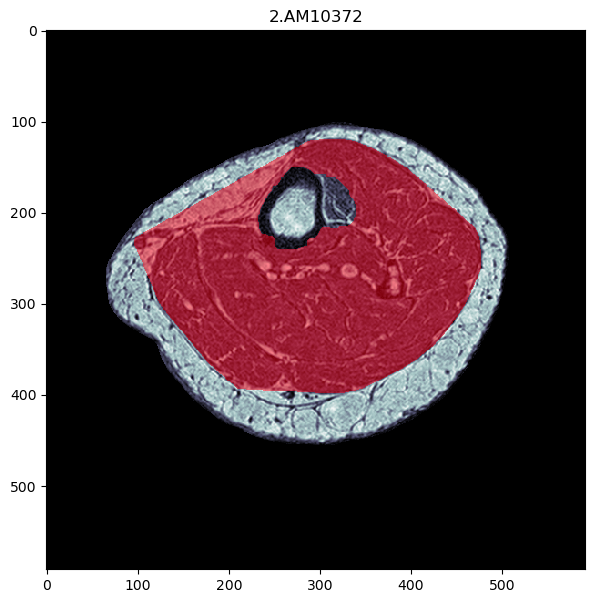

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

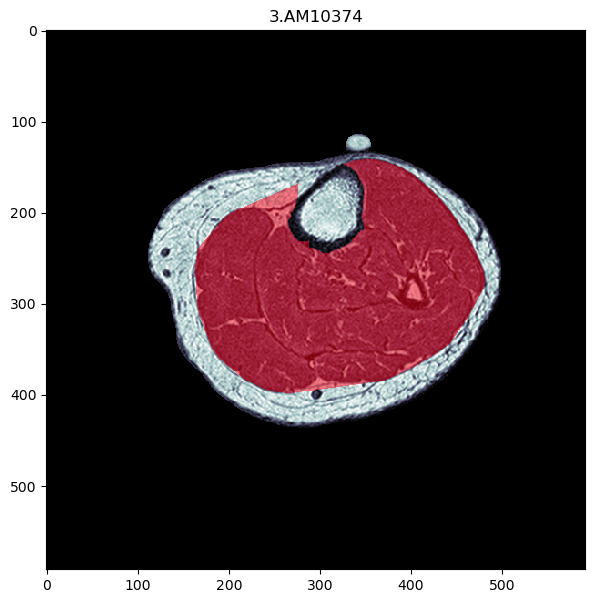

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

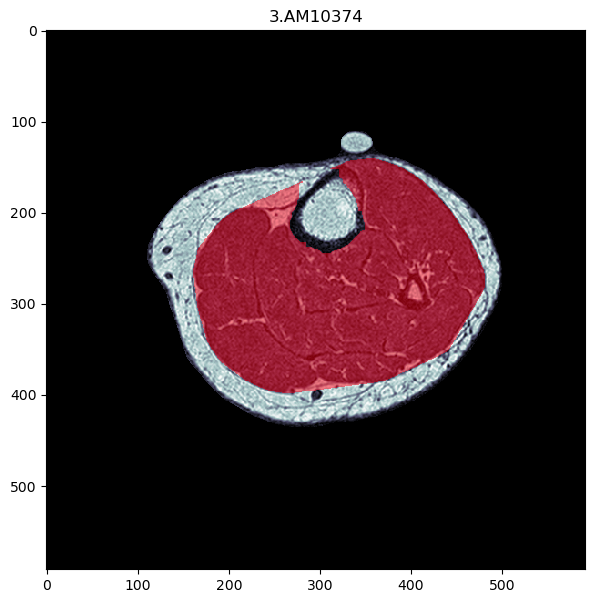

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

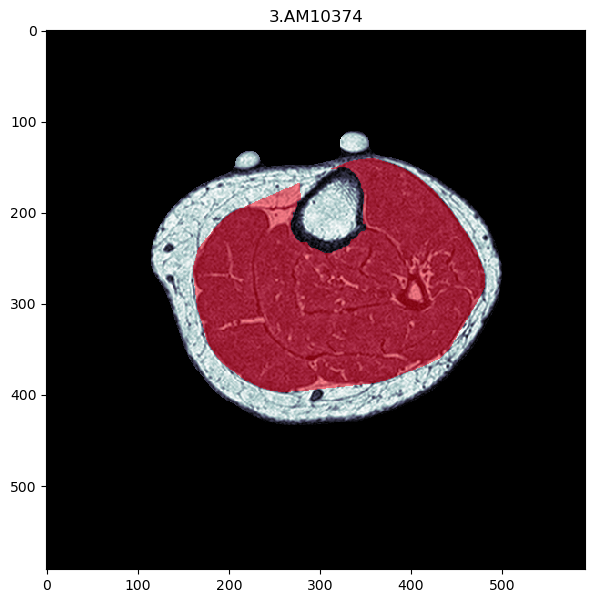

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

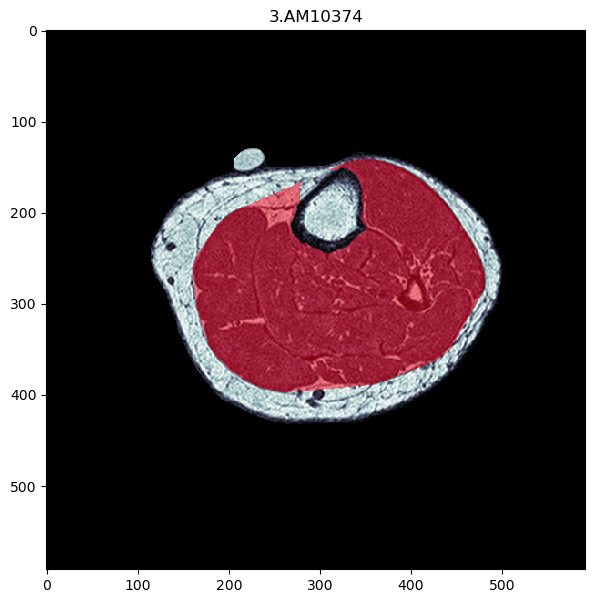

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

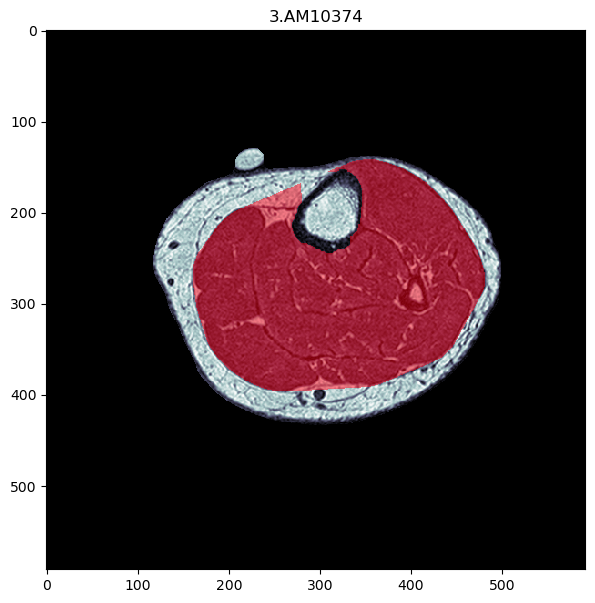

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

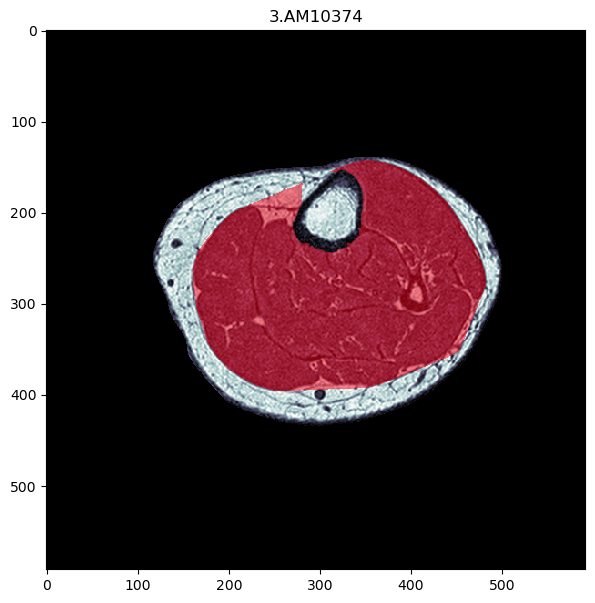

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

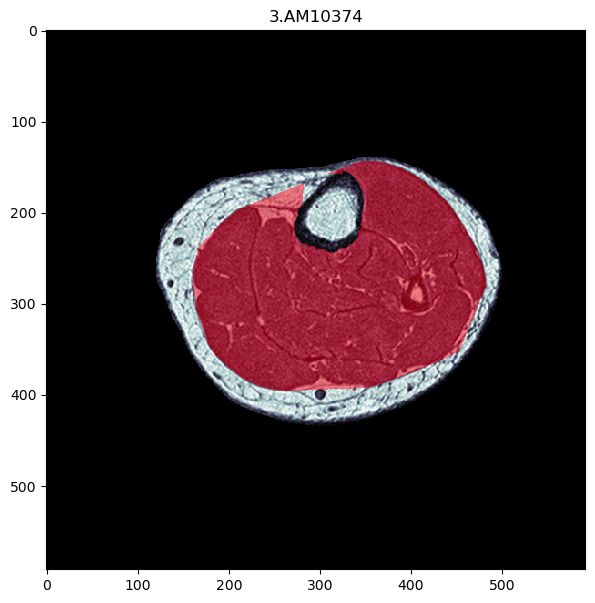

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

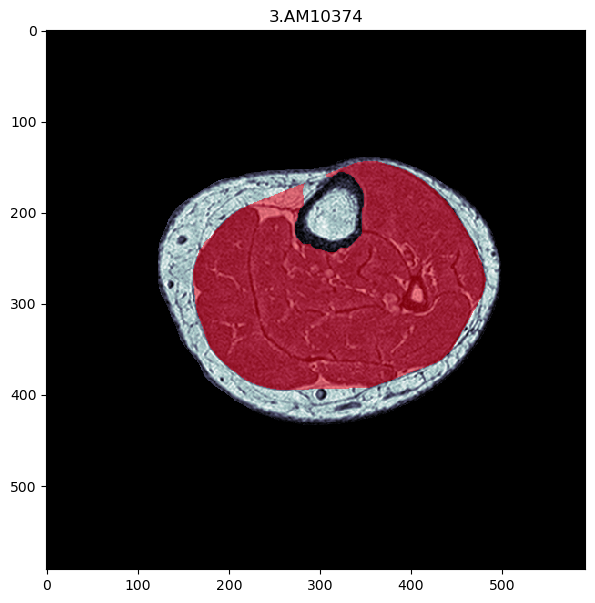

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

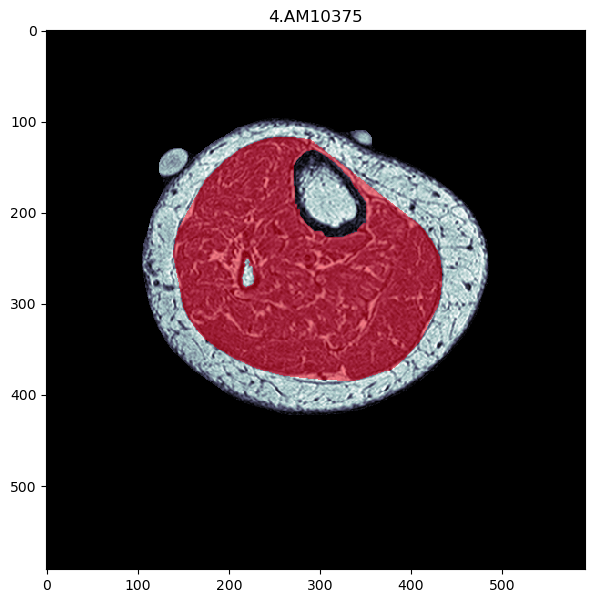

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

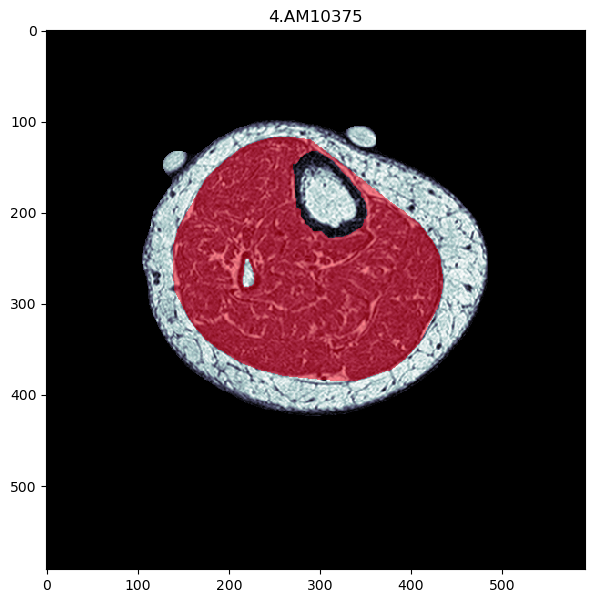

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

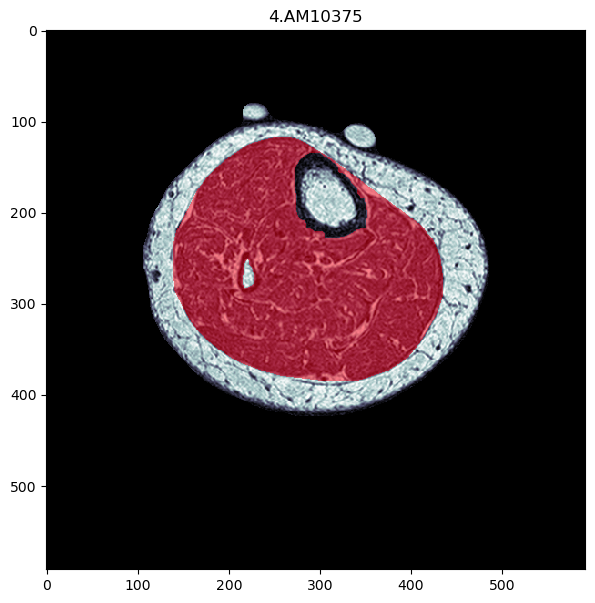

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

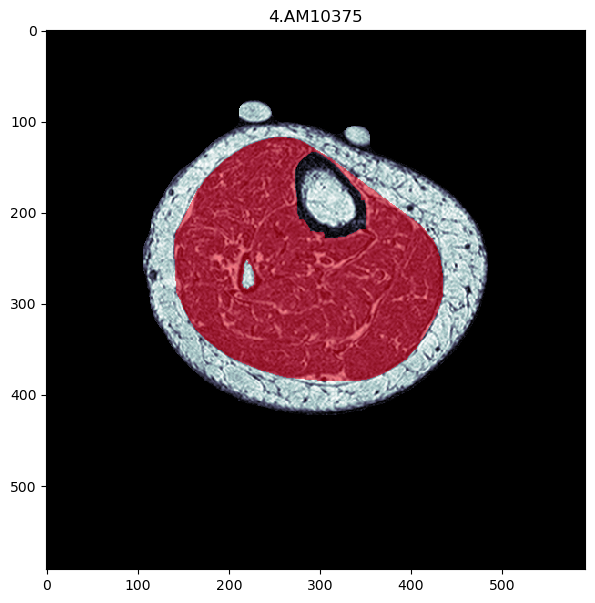

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

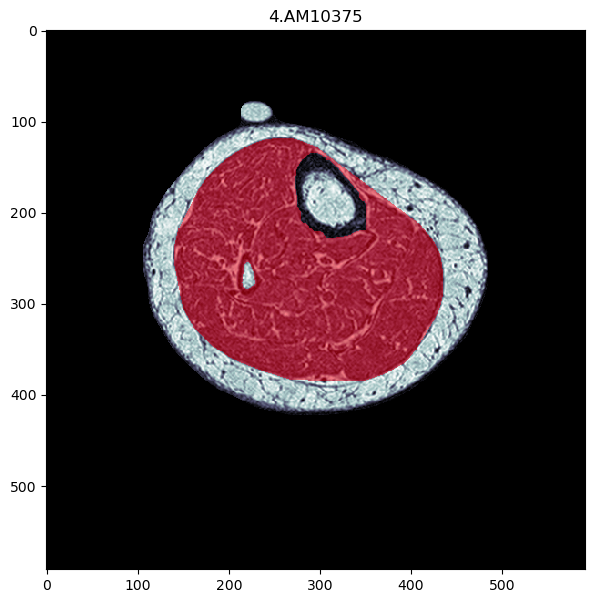

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

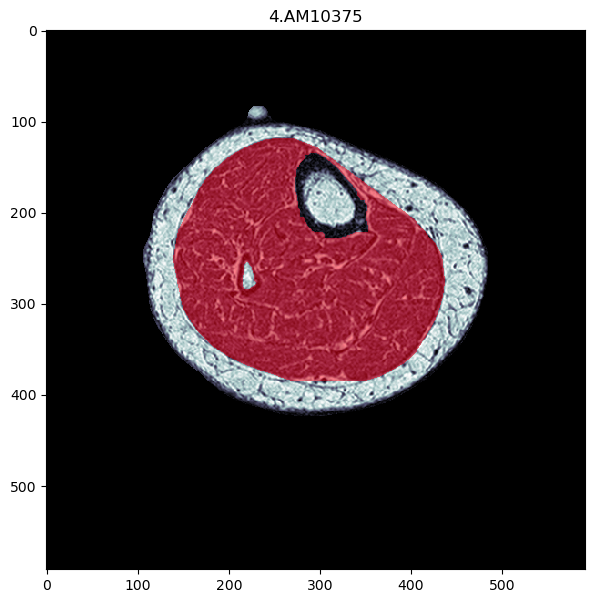

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

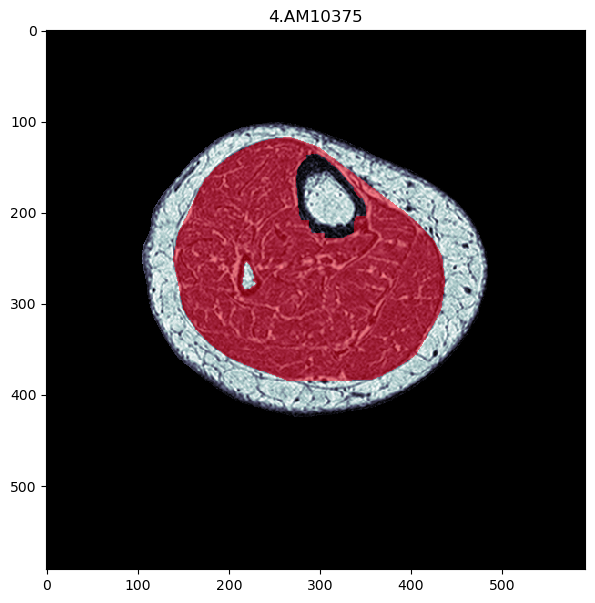

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

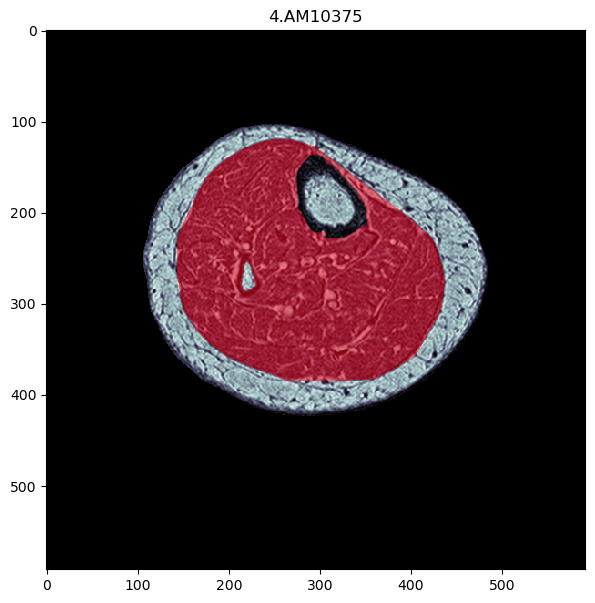

Button(description='Good', style=ButtonStyle())

Button(description='Overshoot', style=ButtonStyle())

Button(description='Undershoot', style=ButtonStyle())

Button(description='Incorrect Thigh Cut', style=ButtonStyle())

In [1192]:
# Quality control step - muscle masks: 
# run through all ROIs and classify quality

data = pd.DataFrame(columns=['ID','slice','Button Clicked'])
for ID_count,files in enumerate(os.listdir(patpath)):
    if ID_count != 9999: #***change to skip any patients that were not able to generate a mask (i.e. error in previous step)
        quality_check(Ivol8c_roi_L[ID_count],roi_mask_L[ID_count],f"{ID_count}.{files}")
    else:
        continue

In [1193]:
# Output corrections to folder as *.tag files 
# to be fixed with Sliceomatic
# Revised 10-01-2024 by AW

data2 = data 
redo = [] #list of patiennt files and slices that need to be redone
for i in range(len(data2)):
    ID = str(data2['ID'][i])
    ID_count = int(ID.split('.')[0]) #get patient index
    slic = int(data2['slice'][i]) - 1 # get slice index
    button = str(data2['Button Clicked'][i]) # determine which button applies
    if button == 'Good': #skip patient with good ROI
        continue
    if button == 'Overshoot' or button == 'Undershoot': #process the image for correction
        #create original DICOM image from the numpy array
        img = sitk.GetImageFromArray(Ivol8c_roi_L[ID_count][slic]) 
        output_filename=os.path.join(output_dir, f'{ID}_Slice{slic}.dcm') 
        sitk.WriteImage(img, output_filename) 
        print(f"{ID}.{slic} Image success")
        #create and write tags for the image
        stid = ID.split('.')[1]
        volsitk = sitk.GetImageFromArray(Ivol8c_roi_L[ID_count][slic]) #sitk of original image
        imfbonemsc = roi_mask_L[ID_count][slic]#numpy array of roi
        slc = slic #identify the slice number but ones isnt 3d
        writetag(output_dir)
        root, root2 = writetofolder(output_dir, output_filename)
        print(f"{ID}.{slic} ROI success")
    if button == 'Incorrect Thigh Cut':
        redo.append((ID,slic)) #add patiient file name and slice number to redo list to be redone later


In [1194]:
%%time

# run through ITSA with corrected tags
# Revised 10-01-2024 AW 

path = patpath # defined in definitions cell
tag_path = output_dir # defined in definitions cell

Ivol8_OG=[]
Ivol8_L=[]

Ivol8c_subcfat_L=[]  
Ivol8c_roi_L=[]
Ivol8c_c_s_L=[]
subcfat_ring_L=[]
musc_mask_final_L=[]
t_L=[]
musc_mask2_L=[]
snake1_mask_L=[]
bone_z_L=[]
bonem_final_L=[]
bonem_c_L=[]
roi_mask_L=[]
fatseg_mask_final_R1_L=[]
fatseg_final_R1_L=[]
fatseg_mask_final_R2_L=[]
fatseg_final_R2_L=[]
for_zcheck_S2R1_L=[]
fatseg1_mask_final_S1_L=[]
fatseg1_final_S1_L=[]
fatseg2_mask_final_S1_L=[]
fatseg2_final_S1_L=[]
final_fat_mask_L=[]
final_fat_L=[]
subcfatmask = []
final_subcfatmask_L = []
final_musc_fat_mask_L=[]
slcs = []

shape = Ivol8c_roi.shape
roi_tag = np.empty(shape, dtype='uint8') 
roi = np.empty(shape, dtype='uint8')
img_hold = np.empty(shape, dtype='uint8')

count = 0

for ID_count,files in enumerate(os.listdir(patpath)):

    minsize = 2*int(8*adjfactor)
    
    #GET IMAGES
    Ivol8_OG,j_OG = I8c_roi_imp_arr[ID_count], I8c_roi_imp_arr[ID_count].shape[0]
    bonem_c = np.zeros([Ivol8c_roi.shape[0], Ivol8c_roi.shape[1], Ivol8c_roi.shape[2]], dtype='uint8') 
    
    #APPLY START SLICE
    Ivol8c_subcfat=I8c_subcfat_imp_arr[ID_count]
    Ivol8c_roi=I8c_roi_imp_arr[ID_count]
    Ivol8=Ivol8_OG

    #Extend ALL four sides by 40 pixels 
    Ivol8,pixels=enlarge_size(Ivol8,40)
    Ivol8c_subcfat,pixels=enlarge_size(Ivol8c_subcfat,40)
    Ivol8c_roi,pixels=enlarge_size(Ivol8c_roi,40)

    Ivol8_L.append([])
    Ivol8_L[ID_count]=Ivol8

    Ivol8c_roi_L.append([])
    Ivol8c_roi_L[ID_count]=Ivol8c_roi

    Ivol8c_subcfat_L.append([])
    Ivol8c_subcfat_L[ID_count]=Ivol8c_subcfat
    
    if ID_count == 54: # *** change to skip any patients that were not able to generate a mask (i.e. error in previous step)
        print(f"{ID_count}. {files} encountered an error")
        #create placeholders
        snake1_mask_L.append(None)
        roi_mask_L.append(None)
        bonem_c_L.append(None)
        bonem_final_L.append(None)
        bone_z_L.append(None)
        for_zcheck_S2R1_L.append(None)
        fatseg1_mask_final_S1_L.append(None)
        fatseg1_final_S1_L.append(None)
        fatseg2_mask_final_S1_L.append(None)
        fatseg2_final_S1_L.append(None)
        final_fat_mask_L.append(None)
        final_fat_L.append(None)
        fatseg_mask_final_R1_L.append(None)
        fatseg_final_R1_L.append(None)
        fatseg_mask_final_R2_L.append(None)
        fatseg_final_R2_L.append(None)
        final_subcfatmask_L.append(None)
        final_musc_fat_mask.append(None)

    else:
        #MUSCLE MASK
        subcfat=get_subcfatvol(Ivol8c_subcfat, minsize)
        musc_fat_mask=get_musc_fat_mask(Ivol8c_subcfat, minsize)
        subcfat_ring=get_subcfat_ring(musc_fat_mask)

        curvature_flow=apply_CurvatureFilter(Ivol8c_subcfat*musc_fat_mask,Ivol8c_roi) 
        Ivol8c_c_s=enhance_sharpness(curvature_flow)
        subcfatvol=get_subcfatvol(Ivol8c_c_s, minsize) 

        #for calf:
        if anatomy == 1:
            subcfatvol_augmented=subcfatvol+subcfat_ring
            for i in range(subcfatvol_augmented.shape[0]):
                _, subcfatvol_augmented[i] = cv2.threshold(subcfatvol_augmented[i], 0, 1, cv2.THRESH_BINARY)

        #for thigh:
        elif anatomy == 2:
            subcfatvol_augmented=subcfatvol+subcfat_ring 
            th, subcfatvol_augmented = cv2.threshold(subcfatvol_augmented, 0, 1, cv2.THRESH_BINARY)

        t, musc_mask2=darkpieces(subcfatvol_augmented, minsize)

        overshoot1,overshoot_removed1=remove_subcfat_overshoot(musc_mask2,Ivol8c_c_s,1,minsize)
        overshoot2,overshoot_removed2=remove_subcfat_overshoot(overshoot_removed1,Ivol8c_c_s,2,minsize)
        b=keep_overlaps(overshoot_removed2,1,minsize)
        musc_mask2=b

        mask_contours, contour_coords_L=get_contours(musc_mask2)
        hull, hull_demonstration,hull_coords=convex_hull(contour_coords_L)
        hullmask=floodfillall(hull) 

        hullmask_contour, hull_coords2=get_contours(hullmask)

        initiator_coords=compatible_coordlist(hull_coords2) 
        
        #REMOVE VESSELS
        vessels_removed_mask, vessels_present=remove_vessels(Ivol8c_c_s, minsize)
        pre_vessels_mask=vessels_removed_mask-vessels_present
        vessels_mask=get_vessels(minsize)

        whites=get_whites() #generate white mask for snakes to follow 
        snake_im=get_snakeim()
        bilateral_t=bilat_fil_snake_im(snake_im)
        snake1_coords=primary_snake()
        snake1_mask=snaketomask(snake1_coords)

        snake1_mask_L.append([])
        snake1_mask_L[ID_count]=snake1_mask
        musc_mask_final=snake1_mask
        
        #BONE REMOVAL
        bone_prep, subcfatmask=get_boneprep(Ivol8c_subcfat,minsize) # AW added subcfatmask

        # Deprecated by AW
        # if anatomy == 1:
        #     bone_prep2=find_potentialbone2(bone_prep)
        # elif anatomy == 2:
        #     bone_prep2=find_potentialbone(bone_prep)

        bone_prep2=tibmask(minsize) # uses bone_prep by default
        
        bone_z,bone_nonz=Z_connectivity_w_adj(bone_prep2)

        bone_z_L.append([])
        bone_z_L[ID_count]=bone_z

        bonem_final=find_potentialbone2(bone_z) 
        bonem_final_L.append([])
        bonem_final_L[ID_count]=bonem_final

        cortical=corticaloutline(Ivol8c_c_s,minsize)
        
        for i in range(j):
            bonem_c[i]=merge_bones(cortical[i],bonem_final[i],minsize)

        fibmask2 = fibmask()
        bonem_c = bonem_c + fibmask2

        bonem_c_L.append([])
        bonem_c_L[ID_count]=bonem_c

        roi_mask, roi=get_roi(snake1_mask,bonem_c,Ivol8c_subcfat)  
        
        roi_mask_L.append([])
        roi_mask_L[ID_count]=roi_mask

        #print(f"{ID_count}. {os.listdir(patpath)[ID_count]} processing success") #indicates that the process was successful
        
    #look for edited tags and update ROI here
        checking_file = os.path.join(tag_path, files)
        # Check if the file has any associated tags
        if os.path.exists(checking_file):
            folder = os.path.join(checking_file,"OutputTags")
            tagarray, tagsln, xdim, ydim  = tagtoarray(folder) #get all tags from folder
            for filename in os.listdir(folder):
                # Extract slice number
                slpos = filename.find(".dcm.tag")
                if slpos < 1: #does not have .dcm.tag and therefore is regular image
                    image = getOG(os.path.join(folder,filename))
                    img_hold[count] = image
                elif slpos > 1 and filename[slpos-1].isdigit():
                    # Collect all consecutive digits preceding ".dcm.tag"
                    digit_str = ""
                    index = slpos - 1

                    while index >= 0 and filename[index].isdigit():
                        digit_str = filename[index] + digit_str
                        index -= 1
                    slicenum = int(digit_str.replace("_", "")) #gives corresponding slice number
                    slcs.append(slicenum)
                    count +=1 
            #goes through all slices and assigns roi based on slice number
            for k in range(count):
                roi_tag[k] = tagarray[k]
                q = slcs[k]
                roi[q] = roi_tag[k] * img_hold[k]
                roi_mask_L[ID_count][q]=roi_tag[k]
            count = 0 #reset counter

        minsize = minsize*5
        
        #========ITSA ========#
        #Set 1: Round 1:
        initial_th_S1R1=initial_th(roi)
        th_S1R1,fatseg_mask_S1R1,fatseg_S1R1=apply_ITSA_no_Z(roi,initial_th_S1R1,minsize) # *** island size - based on original publication - A valid and precise ... Wong et al 2020 
        
        #Set 1: Round 2:
        roi_for_S1R2=subtract_fat1(fatseg_S1R1)
        initial_th_S1R2=initial_th(roi_for_S1R2)
        th_S1R2,fatseg_mask_S1R2,fatseg_S1R2=apply_ITSA_no_Z(roi_for_S1R2,initial_th_S1R2,minsize) # *** island size
    
        #Set 2 prep:
        for_zcheck_S2R1=apply_th(th_S1R2,roi) 
        fatseg1_mask_final_S1,fatseg1_final_S1,fatseg2_mask_final_S1,fatseg2_final_S1=get_final_fatsegs_S1(for_zcheck_S2R1*roi,th_S1R1,for_zcheck_S2R1,roi) 

        #Set 2: Round 1:
        th_S2R1,fatseg_mask_S2R1,fatseg_S2R1=apply_ITSA_w_Z(roi,initial_th_S1R1,for_zcheck_S2R1,minsize) # *** island size
        
        #Set 2: Round 2:
        roi_for_S2R2=subtract_fat1(fatseg_S2R1) 
        initial_th_S2R2=initial_th(roi_for_S2R2)
        th_S2R2,fatseg_mask_S2R2,fatseg_S2R2 = apply_ITSA_w_Z(roi_for_S2R2,initial_th_S1R2,for_zcheck_S2R1,minsize) #change back to roi_for_S2R2 after
        
        #Final connectivity check:
        for_final_zcheck=apply_th(th_S2R2,roi) 
        final_fat_mask, final_fat=apply_final_zcheck(th_S2R2,for_final_zcheck,minsize) # *** island size
        fatseg_mask_final_R1,fatseg_final_R1,fatseg_mask_final_R2,fatseg_final_R2=get_final_fatsegs(final_fat,th_S2R1,final_fat_mask,roi)

        #from set1:

        for_zcheck_S2R1_L.append([])
        fatseg1_mask_final_S1_L.append([])
        fatseg1_final_S1_L.append([])
        fatseg2_mask_final_S1_L.append([])
        fatseg2_final_S1_L.append([])

        for_zcheck_S2R1_L[ID_count]=for_zcheck_S2R1
        fatseg1_mask_final_S1_L[ID_count]=fatseg1_mask_final_S1
        fatseg1_final_S1_L[ID_count]=fatseg1_final_S1
        fatseg2_mask_final_S1_L[ID_count]=fatseg2_mask_final_S1
        fatseg2_final_S1_L[ID_count]=fatseg2_final_S1

        #from set 2:
        final_fat_mask_L.append([])
        final_fat_L.append([])

        fatseg_mask_final_R1_L.append([])
        fatseg_final_R1_L.append([])
        fatseg_mask_final_R2_L.append([])
        fatseg_final_R2_L.append([])
        final_subcfatmask_L.append([])
        final_musc_fat_mask_L.append([])

        final_fat_mask_L[ID_count]=final_fat_mask
        final_fat_L[ID_count]=final_fat

        fatseg_mask_final_R1_L[ID_count]=fatseg_mask_final_R1
        fatseg_final_R1_L[ID_count]=fatseg_final_R1

        fatseg_mask_final_R2_L[ID_count]=fatseg_mask_final_R2
        fatseg_final_R2_L[ID_count]=fatseg_final_R2

        final_subcfatmask_L[ID_count]=subcfatmask
        final_musc_fat_mask_L[ID_count]=musc_fat_mask

        print(f"Participant index {ID_count} {files} success")

Participant index 0 AM10369 success
Participant index 1 AM10371 success
Participant index 2 AM10372 success
Participant index 3 AM10374 success
Participant index 4 AM10375 success
CPU times: total: 31.4 s
Wall time: 49.8 s


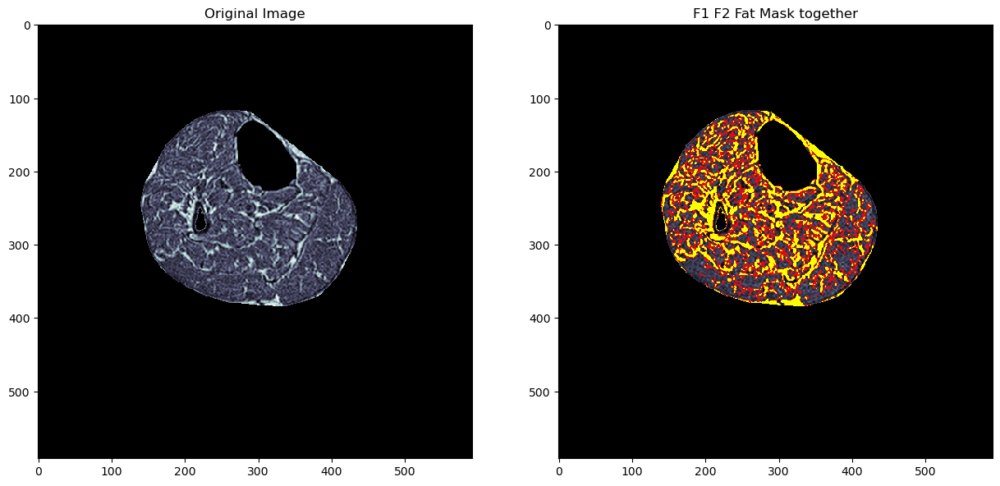

In [1195]:
# Display last participant results: 

slice = 0

fig, axes = plt.subplots(1, 2, figsize=(15, 10))

# Display the base image (orig) using the 'bone' colormap
axes[0].imshow(roi[slice], cmap='bone')
axes[0].set_title('Original Image')

overlay_fatseg_mask_final_R1 = np.ma.masked_where(fatseg_mask_final_R1[slice] == 0, fatseg_mask_final_R1[slice])
overlay_fatseg_mask_final_R2 = np.ma.masked_where(fatseg_mask_final_R2[slice] == 0, fatseg_mask_final_R2[slice])

# Overlay F2 fat mask on the original image
axes[1].imshow(roi[slice], cmap='bone', interpolation='none')
axes[1].imshow(overlay_fatseg_mask_final_R1, cmap="autumn", vmin=0, vmax=1)
axes[1].imshow(overlay_fatseg_mask_final_R2, cmap="bwr", vmin=0, vmax=1, alpha=1)
axes[1].set_title('F1 F2 Fat Mask together')

plt.show()

In [1196]:
# Calculate muscle and fat morphometry:
# Revised 10-01-2024 by AW

im_spacing = patsitk.GetSpacing() #get spacing for original image - for calculations later
ID=files
results_df=[]
for ID_count,files in enumerate(os.listdir(patpath)):
        try:
            ID=files
            results_df.append([])    
            
            final_F1_mask=fatseg_mask_final_R1_L[ID_count] 
            final_F1=fatseg_final_R1_L[ID_count]

            final_F2_mask=fatseg_mask_final_R2_L[ID_count]
            final_F2=fatseg_final_R2_L[ID_count]

            final_BF_mask=final_fat_mask_L[ID_count]
            final_BF=final_fat_L[ID_count]

            final_roi_mask=roi_mask_L[ID_count]
            final_roi=roi_mask_L[ID_count]*Ivol8c_roi_L[ID_count] 
            
           
            results_df[ID_count]=calc2(final_F1_mask,final_F1,final_F2_mask,final_F2,final_BF_mask,final_BF,final_roi_mask,final_roi)
        except:
            print(f"{files} failed")
            continue

# Export to Excel spreadsheet
results_dfall = pd.concat(results_df, ignore_index=True)
store_dir=os.path.join(outdata,"IMFoutputs.xlsx") #***change to excel file name
results_dfall.to_excel(store_dir, index=False)

AM10369 total fatvol= 25280.806664632393

AM10371 total fatvol= 30992.300487836943

AM10372 total fatvol= 34278.91445583475

AM10374 total fatvol= 23512.719667731784

AM10375 total fatvol= 25682.120601441013



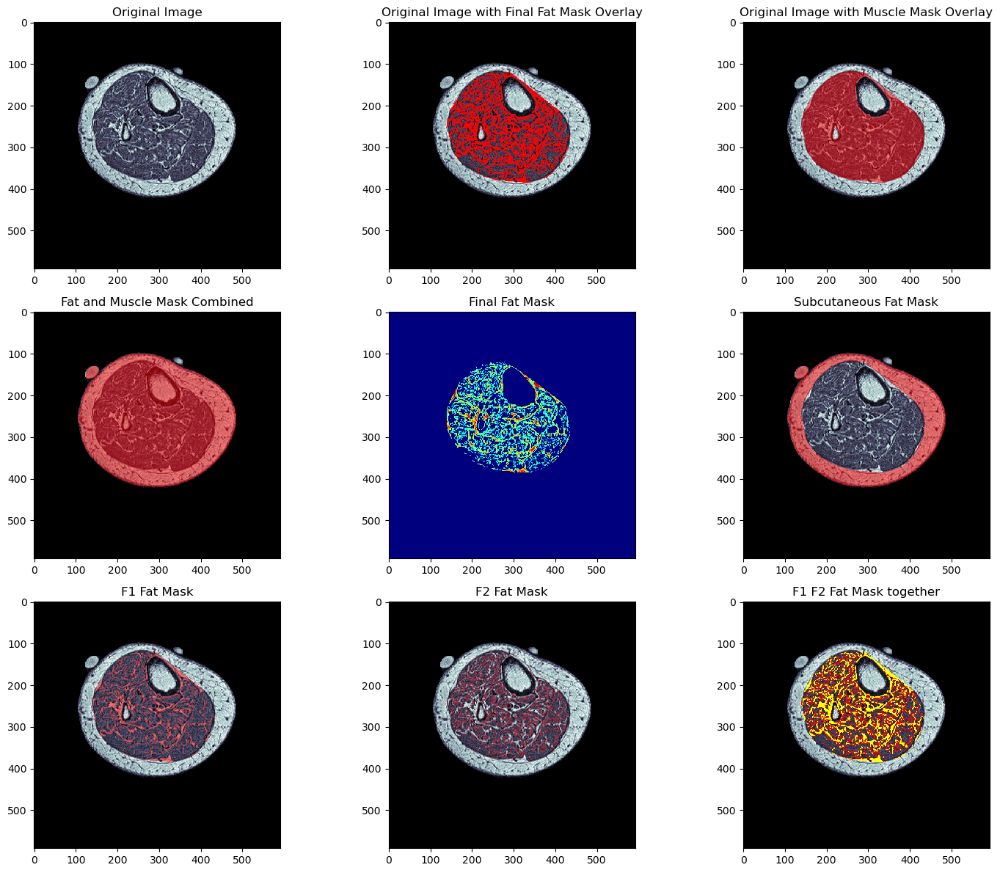

In [1197]:
# Preview segmentation results
previd = 0 # *** enter sequence number ID to preview

orig = Ivol8c_roi[previd]             # Base image (e.g., original ROI)
fat = final_BF_mask[previd]           # Overlay image for fat mask
musc = final_roi_mask[previd]         # Overlay image for muscle mask
musc_fat = musc_fat_mask[previd]      # Combined fat and muscle mask
subcutaneous_fat = subcfatmask[previd]   # Subcutaneous fat mask subcfat2 
F1 = final_F1_mask[previd]                 # Fat mask F1
F2 = final_F2_mask[previd]                 # Fat mask F2

# Define the number of rows for subplots
rows = 3

# Create a figure and axes for the subplots
fig, axes = plt.subplots(rows, 3, figsize=(15, 4 * rows))

# Display the base image (orig) using the 'bone' colormap
axes[0][0].imshow(orig, cmap='bone', interpolation='none')
axes[0][0].set_title('Original Image')

# Overlay fat mask on the original image
overlay_fat = np.ma.masked_where(fat == 0, fat)
axes[0][1].imshow(orig, cmap='bone', interpolation='none')
axes[0][1].imshow(overlay_fat, cmap='hsv', alpha=1, interpolation='none')
axes[0][1].set_title('Original Image with Final Fat Mask Overlay')

# Overlay muscle mask on the original image
overlay_musc = np.ma.masked_where(musc == 0, musc)
axes[0][2].imshow(orig, cmap='bone', interpolation='none')
axes[0][2].imshow(overlay_musc, cmap='hsv', alpha=0.5)
axes[0][2].set_title('Original Image with Muscle Mask Overlay')

# Display fat mask
axes[1][1].imshow(final_BF[2], cmap='jet')
axes[1][1].set_title('Final Fat Mask')

# Overlay combined fat and muscle mask on the original image
overlay_musc_fat = np.ma.masked_where(musc_fat == 0, musc_fat)
axes[1][0].imshow(orig, cmap='bone', interpolation='none')
axes[1][0].imshow(overlay_musc_fat, cmap='hsv', alpha=0.5)
axes[1][0].set_title('Fat and Muscle Mask Combined')

# Overlay subcutaneous fat mask on the original image
overlay_subcfat = np.ma.masked_where(subcutaneous_fat == 0, subcutaneous_fat)
axes[1][2].imshow(orig, cmap='bone', interpolation='none')
axes[1][2].imshow(overlay_subcfat, cmap='hsv', alpha=0.5)
axes[1][2].set_title('Subcutaneous Fat Mask')

# Overlay F1 fat mask on the original image
overlay_F1 = np.ma.masked_where(F1 == 0, F1)
axes[2][0].imshow(orig, cmap='bone', interpolation='none')
axes[2][0].imshow(overlay_F1, cmap='hsv', alpha=0.5)
axes[2][0].set_title('F1 Fat Mask')

# Overlay F2 fat mask on the original image
overlay_F2 = np.ma.masked_where(F2 == 0, F2)
axes[2][1].imshow(orig, cmap='bone', interpolation='none')
axes[2][1].imshow(overlay_F2, cmap='hsv', alpha=0.5)
axes[2][1].set_title('F2 Fat Mask')

# Overlay F2 fat mask on the original image
axes[2][2].imshow(orig, cmap='bone', interpolation='none')
axes[2][2].imshow(overlay_F1, cmap="autumn", vmin=0, vmax=1)
axes[2][2].imshow(overlay_F2, cmap="bwr", vmin=0, vmax=1, alpha=1)
axes[2][2].set_title('F1 F2 Fat Mask together')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


### Dependencies

In [17]:
%pip freeze

# Complete list of dependencies

absl-py @ file:///home/conda/feedstock_root/build_artifacts/absl-py_1705494584803/work
aiohappyeyeballs @ file:///home/conda/feedstock_root/build_artifacts/aiohappyeyeballs_1723793936996/work
aiohttp @ file:///D:/bld/aiohttp_1723940726527/work
aiosignal @ file:///home/conda/feedstock_root/build_artifacts/aiosignal_1667935791922/work
annotated-types @ file:///home/conda/feedstock_root/build_artifacts/annotated-types_1716290248287/work
anyio @ file:///home/conda/feedstock_root/build_artifacts/anyio_1717693030552/work
argon2-cffi @ file:///home/conda/feedstock_root/build_artifacts/argon2-cffi_1692818318753/work
argon2-cffi-bindings @ file:///D:/bld/argon2-cffi-bindings_1695386877556/work
arrow @ file:///home/conda/feedstock_root/build_artifacts/arrow_1696128962909/work
astor @ file:///home/conda/feedstock_root/build_artifacts/astor_1593610464257/work
astropy @ file:///D:/bld/astropy_1711553114901/work
astropy-iers-data @ file:///home/conda/feedstock_root/build_artifacts/astropy-iers-data_

In [ ]:
#Complete list of packages: 
import tensorflow as tf
import pandas as pd
import os
import pydicom as dicom
import cv2
import matplotlib.pyplot as plt
import numpy as np
import SimpleITK as sitk
import sys
import skimage
from skimage import morphology
from skimage.segmentation import active_contour
from skimage import data, io, img_as_ubyte,filters
from skimage.filters import threshold_multiotsu
from skimage.measure import label, regionprops
import matplotlib as mpl
import imutils 
from typing import Any, Dict
from typing import Tuple, List
from PIL import ImageEnhance 
from PIL import Image
import math 
from astropy.table import QTable 
from tabulate import tabulate
from statistics import mean 
import ipywidgets as widgets
from IPython.display import display
from ipywidgets import interact, interactive, fixed, interact_manual
from ipywidgets import *
import pydicom
import shutil